# 1. 강의영상 

In [1]:
#{{<video https://youtu.be/playlist?list=PLQqh36zP38-wTzMRmZzvr2TL12DNo6jXF&si=RnG6_-uhn9Yb57nU >}}

# 2. Imports

In [1]:
import torch 
import torchvision
import fastai.vision

# 3. XAI란?

> https://brunch.co.kr/@hvnpoet/140

# 4. CAM의 구현을 위한 예비학습

## A. Data

In [3]:
path = untar_data(URLs.PETS)/'images'

In [4]:
path.ls()

(#7393) [Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/boxer_177.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/american_pit_bull_terrier_131.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/keeshond_165.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/samoyed_80.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/Siamese_224.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/miniature_pinscher_59.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/saint_bernard_159.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/american_bulldog_143.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/american_pit_bull_terrier_142.jpg'),Path('/home/cgb3/.fastai/data/oxford-iiit-pet/images/english_cocker_spaniel_78.jpg')...]

In [5]:
files= get_image_files(path)
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'
dls = ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

## B. 이미지 자료 처리

`-` 원래 우리가 아는 방법: path를 의미하는 string $\to$ torch.tensor

In [134]:
torchvision.io.read_image('/home/cgb3/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')

tensor([[[208, 207, 200,  ..., 115, 111, 121],
         [211, 181, 141,  ..., 123, 113, 108],
         [198, 174, 125,  ..., 155, 132, 106],
         ...,
         [213, 207, 195,  ..., 210, 205, 208],
         [216, 210, 200,  ..., 219, 213, 211],
         [221, 206, 193,  ..., 217, 221, 222]],

        [[214, 214, 209,  ..., 116, 112, 122],
         [218, 190, 153,  ..., 121, 111, 106],
         [206, 184, 137,  ..., 154, 131, 105],
         ...,
         [211, 207, 195,  ..., 201, 199, 204],
         [221, 215, 207,  ..., 210, 207, 206],
         [228, 213, 202,  ..., 208, 212, 216]],

        [[230, 222, 206,  ..., 108, 104, 116],
         [224, 187, 143,  ..., 124, 114, 111],
         [209, 176, 123,  ..., 160, 136, 111],
         ...,
         [222, 217, 207,  ..., 202, 199, 205],
         [240, 234, 225,  ..., 211, 207, 210],
         [246, 231, 219,  ..., 209, 215, 220]]], dtype=torch.uint8)

`-` fastai를 이용하는 방법

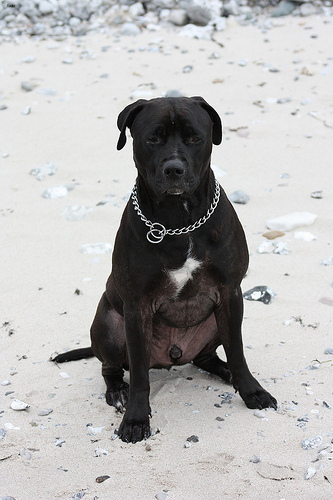

In [148]:
ximg = PILImage.create('/home/cgb3/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
ximg

In [149]:
TensorImage(ximg)

TensorImage([[[208, 214, 230],
              [207, 214, 222],
              [200, 209, 206],
              ...,
              [115, 116, 108],
              [111, 112, 104],
              [121, 122, 116]],

             [[211, 218, 224],
              [181, 190, 187],
              [141, 153, 143],
              ...,
              [123, 121, 124],
              [113, 111, 114],
              [108, 106, 111]],

             [[198, 206, 209],
              [174, 184, 176],
              [125, 137, 123],
              ...,
              [155, 154, 160],
              [132, 131, 136],
              [106, 105, 111]],

             ...,

             [[213, 211, 222],
              [207, 207, 217],
              [195, 195, 207],
              ...,
              [210, 201, 202],
              [205, 199, 199],
              [208, 204, 205]],

             [[216, 221, 240],
              [210, 215, 234],
              [200, 207, 225],
              ...,
              [219, 210, 211],
          

`-` fastai를 이용하는 방법2: 

In [156]:
iter(dls.test_dl([ximg])).__next__()[0]

TensorImage([[[[1.8379, 1.8379, 1.8550,  ..., 1.8379, 1.8379, 1.8379],
               [1.8379, 1.8379, 1.8550,  ..., 1.8379, 1.8379, 1.8379],
               [1.8379, 1.8379, 1.8550,  ..., 1.8379, 1.8379, 1.8379],
               ...,
               [1.7009, 1.7180, 1.7352,  ..., 1.7694, 1.7523, 1.7352],
               [1.8379, 1.8037, 1.7694,  ..., 1.7352, 1.7523, 1.7352],
               [1.7523, 1.7523, 1.7352,  ..., 1.7180, 1.7523, 1.7523]],

              [[2.0434, 2.0434, 2.0609,  ..., 2.0084, 2.0084, 2.0084],
               [2.0434, 2.0434, 2.0609,  ..., 2.0084, 2.0084, 2.0084],
               [2.0434, 2.0434, 2.0609,  ..., 2.0084, 2.0084, 2.0084],
               ...,
               [1.8859, 1.9034, 1.9209,  ..., 1.8683, 1.8333, 1.7983],
               [2.0259, 1.9909, 1.9384,  ..., 1.8683, 1.8508, 1.8158],
               [1.9384, 1.9384, 1.8859,  ..., 1.8859, 1.8683, 1.8508]],

              [[2.2391, 2.2391, 2.2566,  ..., 2.2566, 2.2566, 2.2566],
               [2.2391, 2.2391, 2

In [157]:
first(dls.test_dl([ximg]))[0]

TensorImage([[[[1.8379, 1.8379, 1.8550,  ..., 1.8379, 1.8379, 1.8379],
               [1.8379, 1.8379, 1.8550,  ..., 1.8379, 1.8379, 1.8379],
               [1.8379, 1.8379, 1.8550,  ..., 1.8379, 1.8379, 1.8379],
               ...,
               [1.7009, 1.7180, 1.7352,  ..., 1.7694, 1.7523, 1.7352],
               [1.8379, 1.8037, 1.7694,  ..., 1.7352, 1.7523, 1.7352],
               [1.7523, 1.7523, 1.7352,  ..., 1.7180, 1.7523, 1.7523]],

              [[2.0434, 2.0434, 2.0609,  ..., 2.0084, 2.0084, 2.0084],
               [2.0434, 2.0434, 2.0609,  ..., 2.0084, 2.0084, 2.0084],
               [2.0434, 2.0434, 2.0609,  ..., 2.0084, 2.0084, 2.0084],
               ...,
               [1.8859, 1.9034, 1.9209,  ..., 1.8683, 1.8333, 1.7983],
               [2.0259, 1.9909, 1.9384,  ..., 1.8683, 1.8508, 1.8158],
               [1.9384, 1.9384, 1.8859,  ..., 1.8859, 1.8683, 1.8508]],

              [[2.2391, 2.2391, 2.2566,  ..., 2.2566, 2.2566, 2.2566],
               [2.2391, 2.2391, 2

In [158]:
x.to("cpu").shape

torch.Size([1, 3, 512, 512])

In [167]:
torch.einsum('ocij -> ijc',x.to("cpu")).shape

torch.Size([512, 512, 3])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


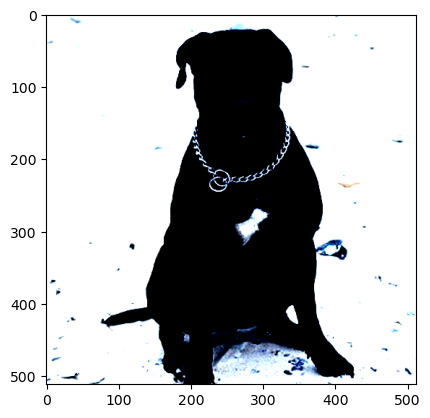

In [168]:
plt.imshow(torch.einsum('ocij -> ijc',x.to("cpu")))

In [171]:
dls.decode([x])

(TensorImage([[[[231, 231, 232,  ..., 231, 231, 231],
                [231, 231, 232,  ..., 231, 231, 231],
                [231, 231, 232,  ..., 231, 231, 231],
                ...,
                [223, 224, 225,  ..., 227, 226, 225],
                [231, 229, 227,  ..., 225, 226, 225],
                [226, 226, 225,  ..., 224, 226, 226]],
 
               [[233, 233, 234,  ..., 231, 231, 231],
                [233, 233, 234,  ..., 231, 231, 231],
                [233, 233, 234,  ..., 231, 231, 231],
                ...,
                [224, 225, 226,  ..., 223, 221, 219],
                [232, 230, 227,  ..., 223, 222, 220],
                [227, 227, 224,  ..., 224, 223, 222]],
 
               [[232, 232, 233,  ..., 233, 233, 233],
                [232, 232, 233,  ..., 233, 233, 233],
                [232, 232, 233,  ..., 233, 233, 233],
                ...,
                [226, 227, 229,  ..., 224, 222, 221],
                [234, 233, 231,  ..., 223, 222, 221],
             

## C. AP layer 

In [11]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1) 

In [12]:
X = torch.arange(48).reshape(1,3,4,4)*1.0 
X

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]],

         [[16., 17., 18., 19.],
          [20., 21., 22., 23.],
          [24., 25., 26., 27.],
          [28., 29., 30., 31.]],

         [[32., 33., 34., 35.],
          [36., 37., 38., 39.],
          [40., 41., 42., 43.],
          [44., 45., 46., 47.]]]])

In [13]:
ap(X)

tensor([[[[ 7.5000]],

         [[23.5000]],

         [[39.5000]]]])

In [14]:
X[0,0,...].mean(),X[0,1,...].mean(),X[0,2,...].mean()

(tensor(7.5000), tensor(23.5000), tensor(39.5000))

# 6. CAM의 구현

## A. 1단계 -- 이미지분류 잘하는 네트워크 선택 

In [15]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

In [17]:
lrnr.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.178080,0.008618,0.995264,00:31


epoch,train_loss,valid_loss,accuracy,time
0,0.036673,0.007956,0.997970,00:41


## B. 2단계-- 네트워크의 끝 부분 수정 

`-` 모형의 분해 

In [18]:
net1= lrnr.model[0]
net2= lrnr.model[1]

`-` net2를 좀더 살펴보자. 

In [19]:
net2

Sequential(
  (0): AdaptiveConcatPool2d(
    (ap): AdaptiveAvgPool2d(output_size=1)
    (mp): AdaptiveMaxPool2d(output_size=1)
  )
  (1): fastai.layers.Flatten(full=False)
  (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): Dropout(p=0.25, inplace=False)
  (4): Linear(in_features=1024, out_features=512, bias=False)
  (5): ReLU(inplace=True)
  (6): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): Dropout(p=0.5, inplace=False)
  (8): Linear(in_features=512, out_features=2, bias=False)
)

In [20]:
_X, _y = dls.one_batch() 

In [21]:
net1.to("cpu")
net2.to("cpu") 
_X = _X.to("cpu")

In [22]:
print(net1(_X).shape)
print(net2[0](net1(_X)).shape)
print(net2[1](net2[0](net1(_X))).shape)
print(net2[2](net2[1](net2[0](net1(_X)))).shape)

torch.Size([64, 512, 16, 16])
torch.Size([64, 1024, 1, 1])
torch.Size([64, 1024])
torch.Size([64, 1024])


`-` net2를 아래와 같이 수정하고 재학습하자 (왜?) 

In [23]:
net2= torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), # (64,512,16,16) -> (64,512,1,1) 
    torch.nn.Flatten(), # (64,512,1,1) -> (64,512) 
    torch.nn.Linear(512,2,bias=False) # (64,512) -> (64,2) 
)

In [24]:
net = torch.nn.Sequential(
    net1,
    net2
)

In [25]:
lrnr2= Learner(dls,net,metrics=accuracy) # loss_fn??

In [26]:
lrnr2.loss_func, lrnr.loss_func ## 알아서 기존의 loss function으로 잘 들어가 있음. 

(FlattenedLoss of CrossEntropyLoss(), FlattenedLoss of CrossEntropyLoss())

In [27]:
lrnr2.fine_tune(5) # net2를 수정해서 accuracy가 안좋아지긴 했는데 그래도 쓸만함 

epoch,train_loss,valid_loss,accuracy,time
0,0.240359,30.371140,0.312585,00:41


epoch,train_loss,valid_loss,accuracy,time
0,0.128956,0.307888,0.870771,00:41
1,0.129678,1.002871,0.734777,00:41
2,0.091930,0.084261,0.967524,00:41
3,0.045101,0.040737,0.985115,00:41
4,0.024163,0.035741,0.985792,00:41


## C. 3단계-- 수정된 net2에서 Linear와 AP의 순서를 바꿈 

`-` 1개의 observation을 고정하였을 경우 출력과정 상상 

In [48]:
ximg = PILImage.create('/home/cgb3/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
x = first(dls.test_dl([ximg]))[0]

In [49]:
net2

Sequential(
  (0): AdaptiveAvgPool2d(output_size=1)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=512, out_features=2, bias=False)
)

In [50]:
print(net1(x).shape)
print(net2[0](net1(x)).shape)
print(net2[1](net2[0](net1(x))).shape)
print(net2[2](net2[1](net2[0](net1(x)))).shape)

torch.Size([1, 512, 16, 16])
torch.Size([1, 512, 1, 1])
torch.Size([1, 512])
torch.Size([1, 2])


`-` 최종결과 확인 

In [51]:
net(x)

TensorImage([[-9.3827,  9.6644]], device='cuda:0', grad_fn=<AliasBackward0>)

In [52]:
dls.vocab

['cat', 'dog']

- net(x)에서 뒤쪽의 값이 클수록 'dog'를 의미한다. 

`-` net2의 순서 바꾸기 전 전체 네트워크: 

$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linear}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [-9.0358,  9.0926]$$

`-` 아래와 같이 순서를 바꿔서 한번 계산해보고 싶다. (왜???..)

$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{linear}{\to} \underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [−9.0358,9.0926]$$

- 여기에서 (1,512,16,16) -> (1,2,16,16) 로 가는 선형변환을 적용하는 방법? **(16,16) each pixel에 대하여 (512 $\to$ 2)로 가는 변환을 수행**

`-` 통찰: 이 경우 특이하게도 레이어의 순서를 바꿨을때 출력이 동일함 (선형변환하고 평균내거나 평균내고 선형변환하는건 같으니까) 

In [53]:
_x =torch.tensor([1,2,3.14,4]).reshape(4,1)
_x 

tensor([[1.0000],
        [2.0000],
        [3.1400],
        [4.0000]])

In [54]:
_l1 = torch.nn.Linear(1,1,bias=False)
_l1(_x).mean() # _x -> 선형변환 -> 평균 

tensor(2.2609, grad_fn=<MeanBackward0>)

In [55]:
_l1(_x.mean().reshape(1,1)) # _x -> 평균 -> 선형변환

tensor([[2.2609]], grad_fn=<MmBackward0>)

`-` 구현해보자. 

In [56]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))

In [57]:
net2[0](why)

TensorImage([[[[-9.3827]],

              [[ 9.6644]]]], device='cuda:0', grad_fn=<AliasBackward0>)

In [58]:
net(x)

TensorImage([[-9.3827,  9.6644]], device='cuda:0', grad_fn=<AliasBackward0>)

### 잠깐 멈추고 생각 좀 해보자..

`-` 이미지

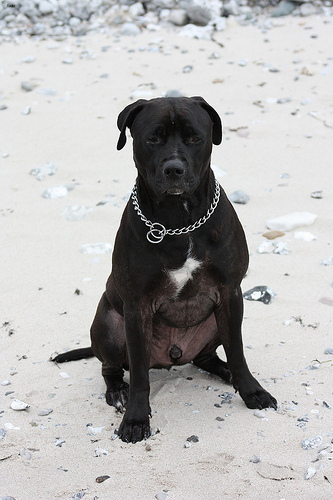

In [59]:
ximg

`-` 네트워크의 결과

In [60]:
net2(net1(x))

TensorImage([[-9.3827,  9.6644]], device='cuda:0', grad_fn=<AliasBackward0>)

- -9.0358 << 9.0926 이므로 'ximg'는 높은 확률로 개라는 뜻이다. 

`-` 아래의네트워크를 관찰 

$$\underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}} = [-9.0358,9.0926]$$

In [61]:
net2[0](why)

TensorImage([[[[-9.3827]],

              [[ 9.6644]]]], device='cuda:0', grad_fn=<AliasBackward0>)

더 파고들어서 분석해보자. 

In [62]:
why.shape

torch.Size([1, 2, 16, 16])

In [63]:
(why[0,0,:,:]).mean(), (why[0,1,:,:]).mean()

(TensorImage(-9.3827, device='cuda:0', grad_fn=<AliasBackward0>),
 TensorImage(9.6644, device='cuda:0', grad_fn=<AliasBackward0>))

***`why[0,0,:,:]`***

In [64]:
#collapse_output
(why[0,0,:,:]).to(torch.int64)

TensorImage([[  -1,   -2,   -1,    0,    0,   -1,   -3,   -6,   -5,   -3,   -1,
                -1,   -2,   -2,   -1,   -1],
             [  -1,   -1,    0,    0,    0,   -6,  -20,  -28,  -27,  -18,   -9,
                -2,   -1,   -2,   -2,   -1],
             [   0,    0,    0,    0,    0,  -11,  -37,  -62,  -61,  -45,  -23,
                -5,   -1,    0,   -1,   -1],
             [  -1,    0,    0,    0,    0,  -12,  -43,  -83,  -93,  -69,  -36,
                -8,    0,    0,    0,    0],
             [   0,   -1,   -1,   -1,   -1,  -10,  -39,  -86, -117,  -92,  -44,
               -11,    0,    0,    0,    0],
             [   0,   -1,   -1,   -1,   -1,   -5,  -27,  -69, -103,  -93,  -48,
               -13,   -1,   -1,   -1,   -4],
             [   0,    0,    0,    0,    0,   -1,  -15,  -44,  -72,  -73,  -42,
               -11,   -1,   -1,   -1,   -3],
             [   0,    0,    1,    0,    0,    0,   -9,  -30,  -44,  -43,  -24,
                -7,    0,   -1,   -1,   -1],


- 이 값들의 평균은 -9.0358 이다. (이 값이 클수록 이 그림이 고양이라는 의미 = 이 값이 작을수록 이 그림이 고양이가 아니라는 의미) 
- 그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만 특정위치에서 엄청 큰 작은값이 있어서 -9.0358이라는 평균값이 나옴 $\to$ 특정위치에 존재하는 엄청 작은 값들은 ximg가 고양이가 아니라고 판단하는 근거가 된다. 

***`why[0,1,:,:]`***

In [65]:
#collapse_output
(why[0,1,:,:]).to(torch.int64)

TensorImage([[  1,   3,   1,   0,   0,   1,   4,   6,   6,   3,   1,   1,   2,
                2,   1,   1],
             [  2,   1,   0,   0,   0,   6,  20,  27,  27,  18,   9,   2,   2,
                2,   3,   2],
             [  0,   0,   0,   0,   0,  11,  37,  62,  60,  45,  23,   5,   1,
                0,   1,   1],
             [  1,   0,   0,   0,   0,  13,  44,  83,  92,  68,  35,   8,   0,
                0,   0,   0],
             [  0,   1,   1,   1,   1,  11,  41,  87, 117,  91,  43,  10,   0,
                0,   0,   0],
             [  0,   1,   1,   1,   1,   6,  29,  71, 104,  94,  48,  13,   1,
                1,   1,   3],
             [  1,   0,   0,   0,   0,   1,  17,  46,  74,  74,  42,  11,   1,
                1,   1,   3],
             [  0,   0,   0,   0,   0,   0,   9,  31,  45,  44,  25,   7,   0,
                2,   1,   1],
             [  0,   0,   0,   0,   0,   1,   7,  21,  28,  21,  10,   2,   0,
                1,   1,   1],
             [  0, 

- 이 값들의 평균은 9.0926 이다. (이 값이 클수록 이 그림이 강아지라는 의미) 
- 그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만 특정위치에서 엄청 큰 값들이 있어서 9.0926이라는 평균값이 나옴 $\to$ 특정위치에 존재하는 엄청 큰 값들은 결국 ximg를 강아지라고 판단하는 근거가 된다. 

`-` 시각화

In [66]:
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

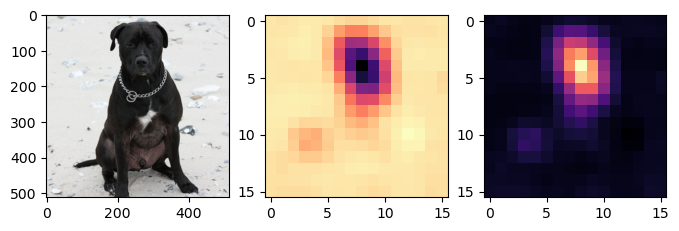

In [67]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma')

- magma = 검은색 < 보라색 < 빨간색 < 노란색
- 왼쪽그림의 검은 부분은 고양이가 아니라는 근거, 오른쪽그림의 노란부분은 강아지라는 근거 

`-` why_cat, why_dog를 (16,16) $\to$ (512,512) 로 resize 

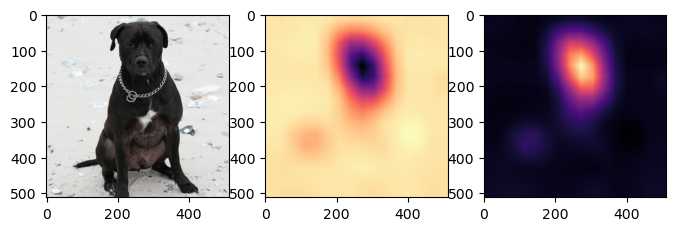

In [68]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')

`-` 겹쳐그리기

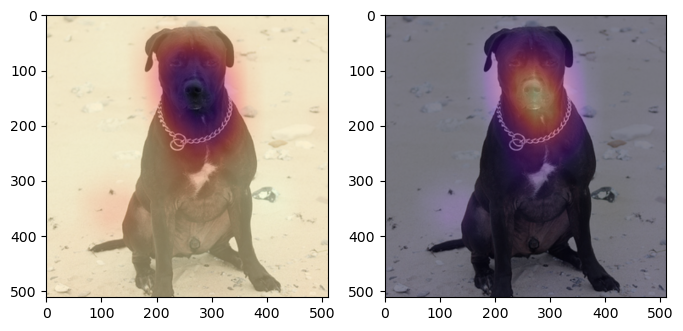

In [70]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화

In [ ]:
import requests

In [ ]:
ximg= PILImage.create(requests.get('https://github.com/guebin/DL2022/blob/main/posts/I.%20Overview/2022-09-06-hani01.jpeg?raw=true').content)
x= first(dls.test_dl([ximg]))[0]

In [80]:
x.shape

torch.Size([1, 3, 512, 512])

In [86]:
#plt.imshow(torch.einsum('ocij -> ijc',x.to("cpu")))

In [87]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

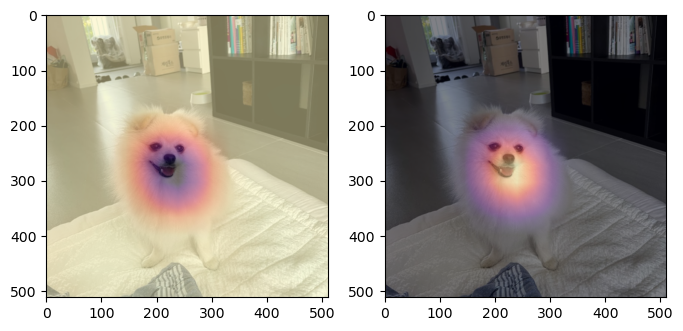

In [96]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화 with prob

In [97]:
sftmax=torch.nn.Softmax(dim=1)

In [98]:
sftmax(net(x))

TensorImage([[2.8841e-05, 9.9997e-01]], device='cuda:0',
            grad_fn=<AliasBackward0>)

In [99]:
catprob, dogprob = sftmax(net(x))[0,0].item(), sftmax(net(x))[0,1].item()

Text(0.5, 1.0, 'dogprob=0.999971')

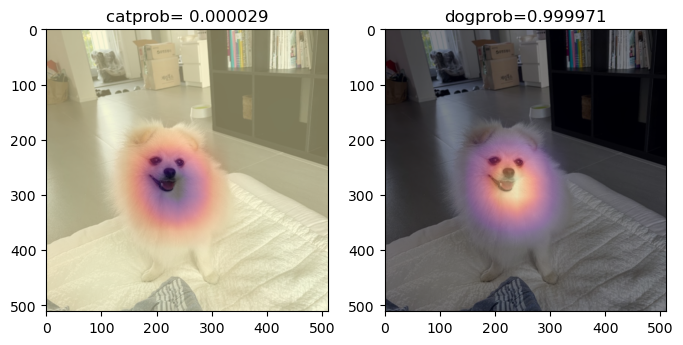

In [103]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[0].set_title(f'catprob= {catprob:.6f}') 
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].set_title(f'dogprob={dogprob:.6f}')

## D. 4단계 -- CAM 시각화 

In [104]:
sftmax = torch.nn.Softmax(dim=1)

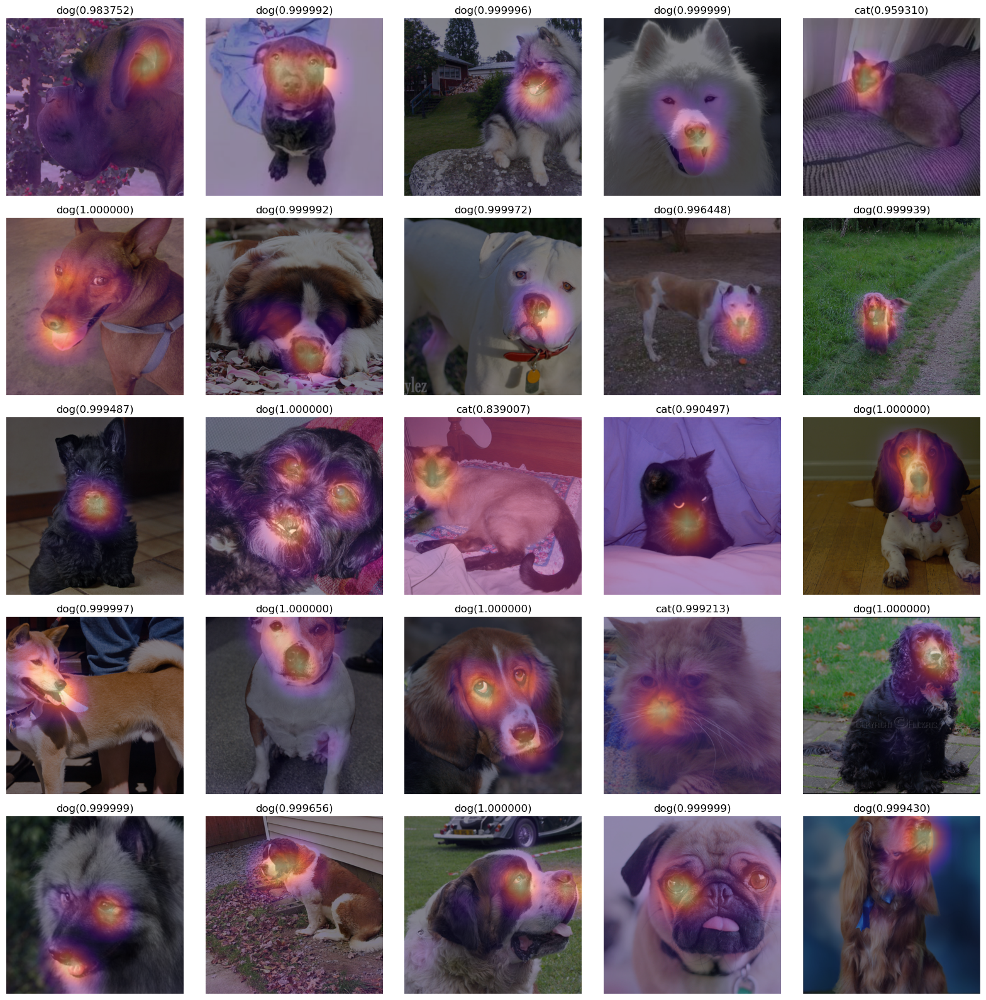

In [105]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

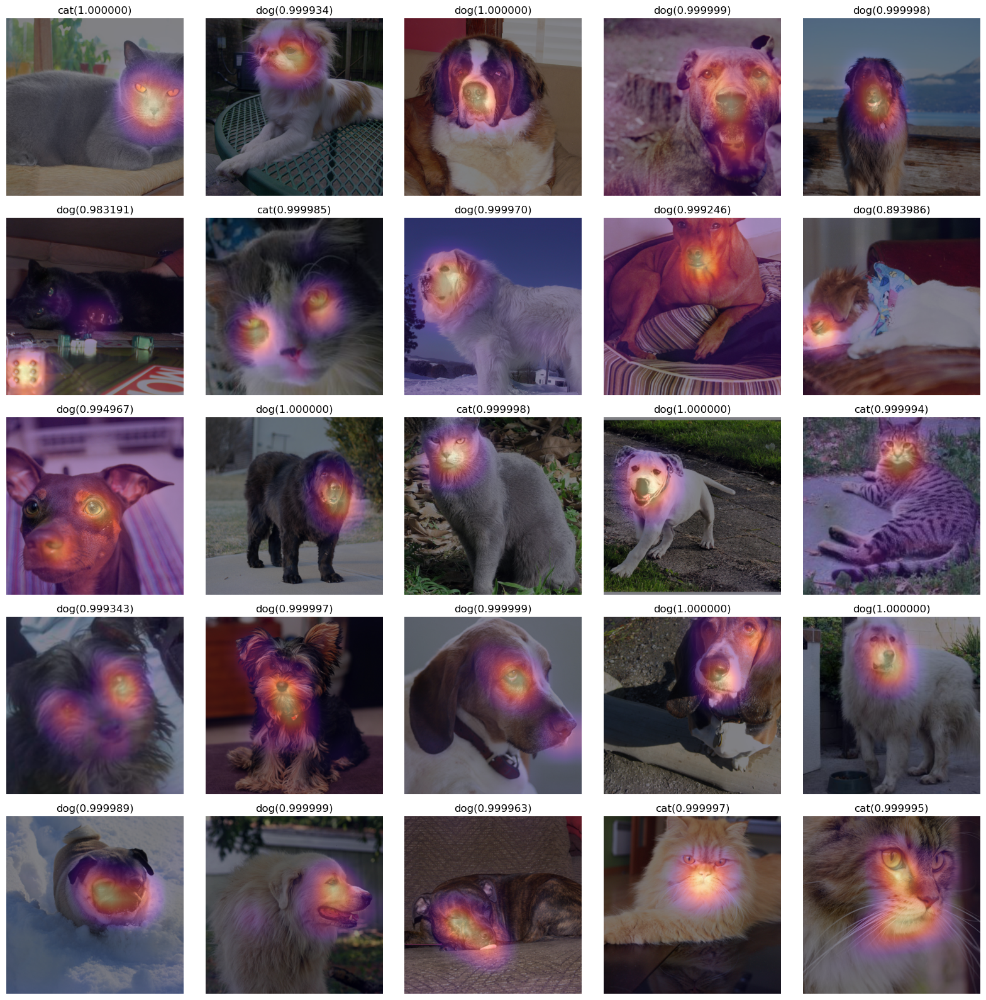

In [106]:
fig, ax = plt.subplots(5,5) 
k=25
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

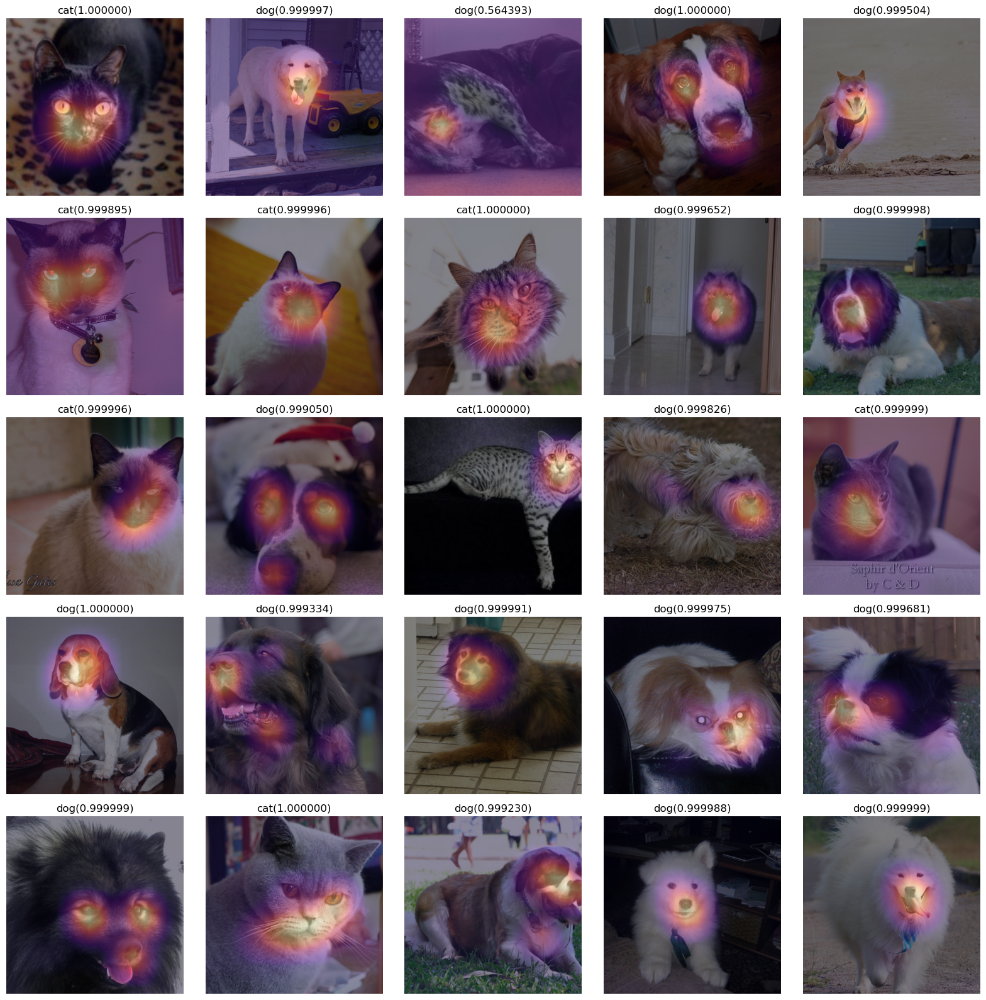

In [107]:
fig, ax = plt.subplots(5,5) 
k=50
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

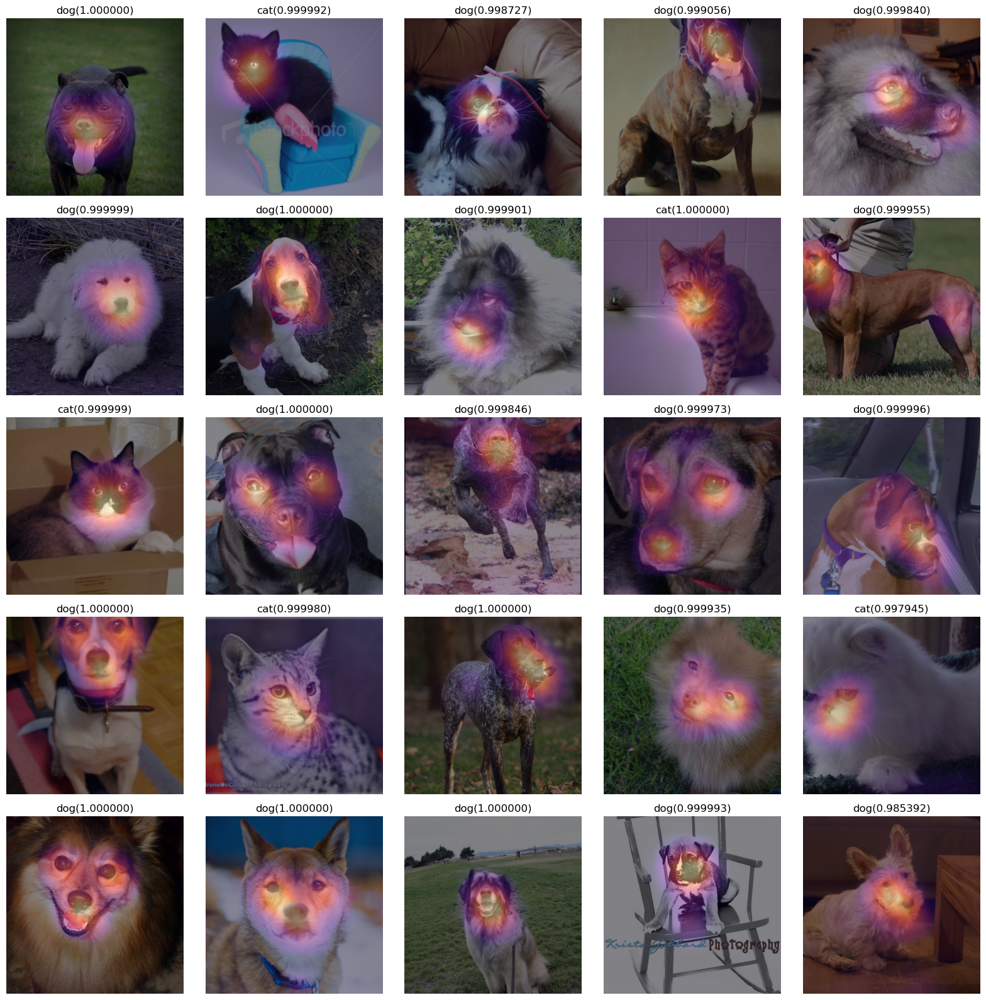

In [108]:
fig, ax = plt.subplots(5,5) 
k=75
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()